In [1]:
SEMINAR_PATH = '/home/jim/PycharmProjects'
import sys
sys.path.append(SEMINAR_PATH)

import seminar
import seminar.preproc as pp
import seminar.preproc.readers as rs

import satpy as sp

import geoviews as gv
import geoviews.feature as gf

import hvplot.xarray
from datetime import datetime
import satpy as sp
import xarray as xr

import numpy as np

gv.extension('bokeh')

gaierror: [Errno 8] nodename nor servname provided, or not known

In [ ]:
import re
from datetime import timedelta

In [ ]:
from importlib import reload
reload(seminar)
reload(rs)
reload(pp)

In [5]:
files = sp.find_files_and_readers(base_dir="/home/jim/mount/shared/course/geo441/data/2020_Camargue/s2/30m",
                               reader='generic_image')
scn = sp.Scene(filenames=files)

KeyError: 10

In [ ]:
from satpy.config import check_satpy
check_satpy()

In [14]:
reader = rs.SeminarReader(time_pattern=r'_([0-9T]+)_', 
                          incl_pattern='.*T31TEH.*',
                          dirpath='/home/jim/mount/shared/course/geo441/data/2020_Camargue/s2/30m')

In [15]:
len(reader._path_dict)

165

In [3]:
reader2 = rs.SeminarReader(time_pattern=r'_([0-9]+)_', 
                          incl_pattern='.*_model.*',
                          dirpath='/home/jim/mount/shared/course/geo441/data/2020_Camargue/optical')

In [4]:
reader3 = rs.SeminarReader(time_pattern=r'_([0-9]+)_', 
                          incl_pattern='.*_original.*',
                          dirpath='/home/jim/mount/shared/course/geo441/data/2020_Camargue/optical')

In [5]:
arrs, bboxs = reader2.query(time=(reader2.min_time, reader2.min_time + timedelta(days=30)))

In [6]:
arrs_orig, bboxs_orig = reader3.query(time=(reader3.min_time, reader3.min_time + timedelta(days=30)))

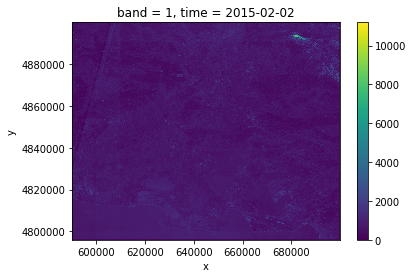

In [24]:
arrs[3].isel(band=0).plot()

In [ ]:
len(arrs)

In [26]:
arrs[0].hvplot.quadmesh('x', 'y', width=600, height=500, rasterize=True)

:DynamicMap   [band]
   :Image   [x,y]   (value)

In [30]:
arrs_orig[0].hvplot.quadmesh('x', 'y', width=600, height=500, rasterize=True)

:DynamicMap   [band]
   :Image   [x,y]   (value)

In [31]:
arrs[0].isel(band=[40, 75, 65]).hvplot.rgb(x='x', y='y', bands='band', data_aspect=1, flip_yaxis=True, xaxis=False, yaxis=None)


IndexError: index 40 is out of bounds for axis 0 with size 6

In [8]:
darr = xr.concat(arrs, dim='time')

In [11]:
darr_orig = xr.concat(arrs_orig, dim='time')

In [10]:
darr.hvplot.quadmesh('x', 'y', width=600, height=500, rasterize=True)

:DynamicMap   [time,band]
   :Image   [x,y]   (value)

In [12]:
darr_orig.hvplot.quadmesh('x', 'y', width=600, height=500, rasterize=True)

:DynamicMap   [time,band]
   :Image   [x,y]   (value)

In [15]:
darr_orig.descriptions

('blue', 'green', 'red', 'nir', 'swir1', 'swir2', 'tir1', 'tir2')

In [27]:
bbox = (5.905e5, 4.835e6, 6.6997e5, 4.798e5)

In [28]:
reader4 = rs.SeminarReader(time_pattern=r'_([0-9]+)_', 
                          incl_pattern='.*',
                          dirpath='/home/jim/mount/shared/course/geo441/data/2020_Camargue/s1/composite/iw/6d_12d/vv')

In [29]:
arrs4, bboxs4 = reader4.query(bbox=bbox, time=(reader4.min_time, reader4.min_time + timedelta(days=20)))

In [30]:
logarrs4 = 10 * np.log(arrs4)

/home/jim/miniconda3/envs/seminar/lib/python3.7/site-packages/xarray/core/computation.py:604: RuntimeWarning: invalid value encountered in log
  result_data = func(*input_data)


In [31]:
logarrs4.hvplot.quadmesh('x', 'y', width=600, height=500, rasterize=True)

:DynamicMap   [time]
   :Image   [x,y]   (value)

In [32]:
bboxs4[0]._df

,geometry
0,"POLYGON ((699980.000 4796020.000, 699980.000 4..."
